In [9]:
import pandas as pd
import matplotlib.pyplot as plt
pd.set_option("display.max_columns", None)

In [3]:
crime = pd.read_csv("crime_preprocessed_exploration")

In [4]:
violent_crime_list = ['Assault', 'Fel Assault', 'Weapons', 'Robbery', 'Offense Against Family/Children', 'Rape', 'Sex Offenses', 'Homicide']
violent_crime = crime[crime['UCRdesc'].isin(violent_crime_list)]

non_violent_crime_list = ['All Other Offenses', 'Theft', 'Vandalism', 'Burglary', 'GTMV', 'Fraud', 'Drug Abuse Violations', 'Driving Under The Influence', 'Embezzlement', 'Stolen Property', 'Forgery & Counterfeiting', 'Arson', 'Disorderly Conduct', 'Liquor Laws', 'Prostitution', 'Property Damaged', 'Traffic Violations', 'Drunkenness', 'Gambling', '1C']
non_violent_crime = crime[crime['UCRdesc'].isin(non_violent_crime_list)]

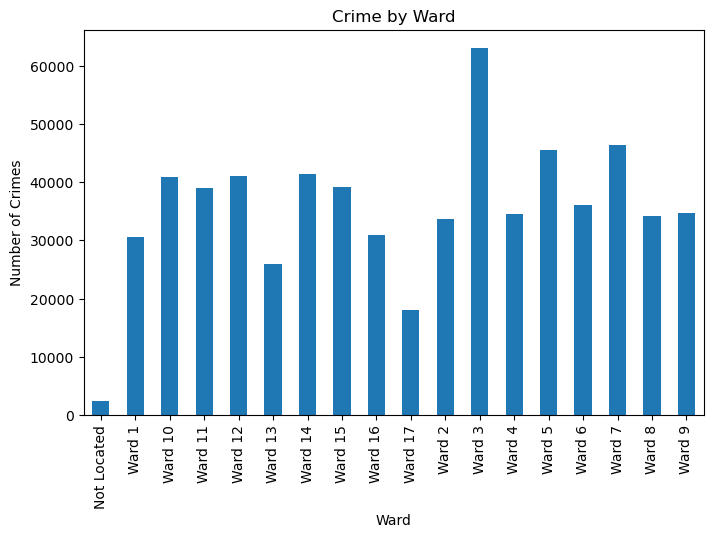

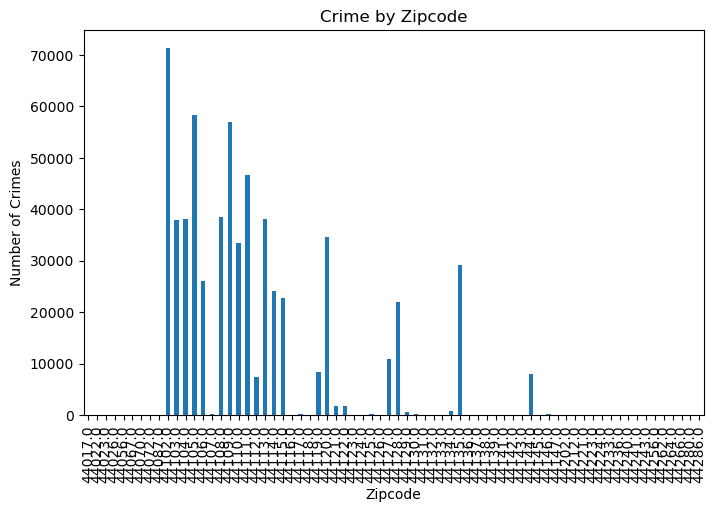

In [5]:
# ALL CRIME

# Aggregate by ward
crime_ward = crime.groupby('WARD').size()

# Plot crime trends by ward
plt.figure(figsize=(8, 5))
crime_ward.plot(kind='bar')
plt.title('Crime by Ward')
plt.xlabel('Ward')
plt.ylabel('Number of Crimes')
plt.show()

# Aggregate by zipcode
crime_zip = crime.groupby('Zip').size()

# Plot crime trends by day of the week
plt.figure(figsize=(8, 5))
crime_zip.plot(kind='bar')
plt.title('Crime by Zipcode')
plt.xlabel('Zipcode')
plt.ylabel('Number of Crimes')
plt.show()

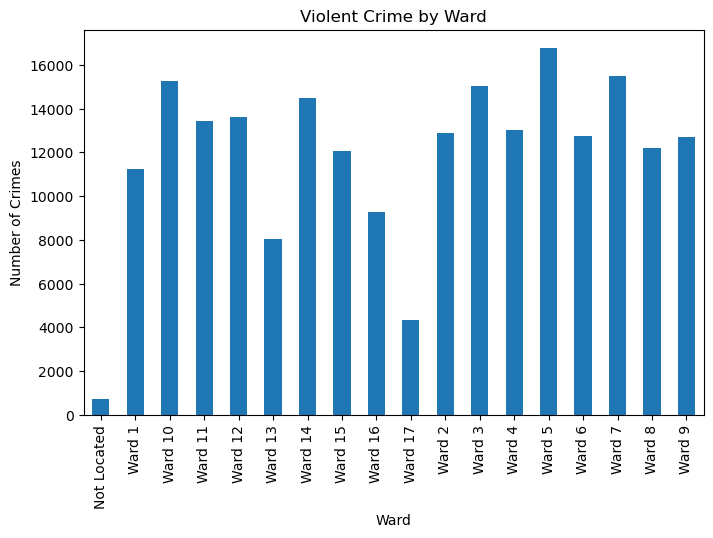

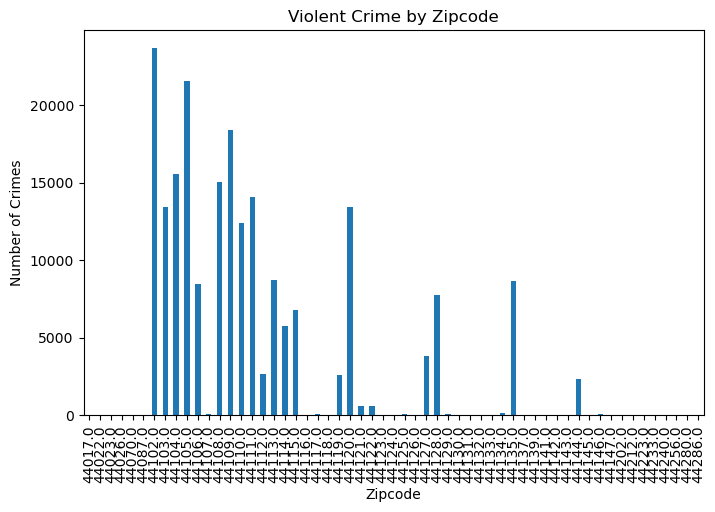

In [6]:
# VIOLENT CRIME

# Aggregate by ward
crime_ward = violent_crime.groupby('WARD').size()

# Plot crime trends by ward
plt.figure(figsize=(8, 5))
crime_ward.plot(kind='bar')
plt.title('Violent Crime by Ward')
plt.xlabel('Ward')
plt.ylabel('Number of Crimes')
plt.show()

# Aggregate by zipcode
crime_zip = violent_crime.groupby('Zip').size()

# Plot crime trends by day of the week
plt.figure(figsize=(8, 5))
crime_zip.plot(kind='bar')
plt.title('Violent Crime by Zipcode')
plt.xlabel('Zipcode')
plt.ylabel('Number of Crimes')
plt.show()

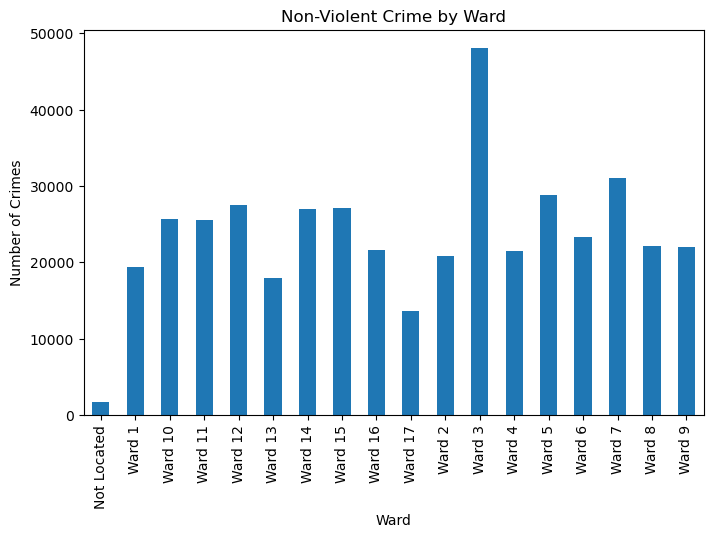

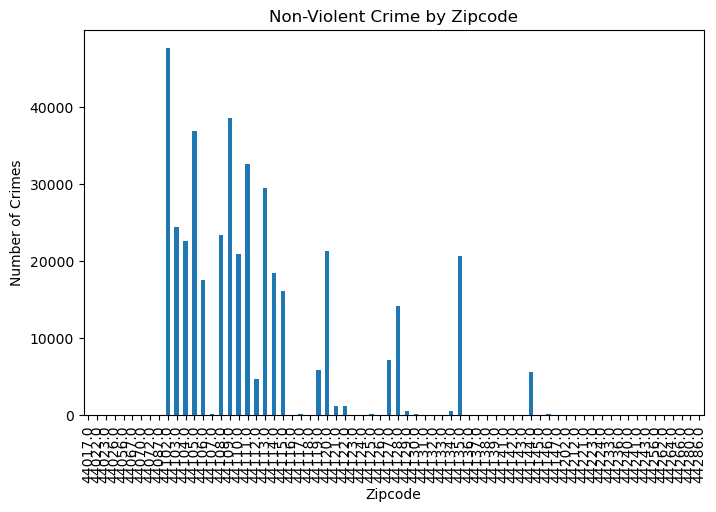

In [7]:
# NON-VIOLENT CRIME

# Aggregate by ward
crime_ward = non_violent_crime.groupby('WARD').size()

# Plot crime trends by ward
plt.figure(figsize=(8, 5))
crime_ward.plot(kind='bar')
plt.title('Non-Violent Crime by Ward')
plt.xlabel('Ward')
plt.ylabel('Number of Crimes')
plt.show()

# Aggregate by zipcode
crime_zip = non_violent_crime.groupby('Zip').size()

# Plot crime trends by day of the week
plt.figure(figsize=(8, 5))
crime_zip.plot(kind='bar')
plt.title('Non-Violent Crime by Zipcode')
plt.xlabel('Zipcode')
plt.ylabel('Number of Crimes')
plt.show()

In [13]:
!pip install folium
import folium

In [14]:
from folium.plugins import HeatMap

# Filter out rows with missing lat/lon values
crime_heat_data = [[row['LAT'], row['LON']] for index, row in violent_crime.iterrows() if not pd.isnull(row['LAT']) and not pd.isnull(row['LON'])]

# Create a heatmap
crime_heatmap = folium.Map(location=[41.5, -81.7], zoom_start=12)
HeatMap(crime_heat_data, radius=7, blur=5, min_opacity=0.4).add_to(crime_heatmap)

# Display the heatmap
crime_heatmap

In [15]:
from folium.plugins import HeatMap

# Filter out rows with missing lat/lon values
crime_heat_data = [[row['LAT'], row['LON']] for index, row in non_violent_crime.iterrows() if not pd.isnull(row['LAT']) and not pd.isnull(row['LON'])]

# Create a heatmap
crime_heatmap = folium.Map(location=[41.5, -81.7], zoom_start=12)
HeatMap(crime_heat_data, radius=7, blur=5, min_opacity=0.4).add_to(crime_heatmap)

# Display the heatmap
crime_heatmap